In [73]:
import numpy as np
import pandas as pd

In [75]:
df = pd.read_csv('HandWrittenImage.csv')

In [76]:
df.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [77]:
import matplotlib.pyplot as plt

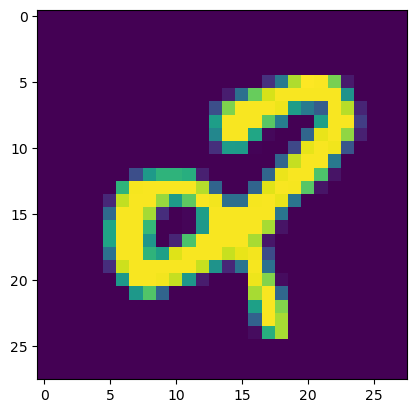

In [81]:
plt.imshow(df.iloc[104,1:].values.reshape(28, 28))

In [83]:
x = df.iloc[:, 1:]
y = df.iloc[:, 0]

In [85]:
from sklearn.model_selection import train_test_split

In [87]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = .2, random_state = 42)

In [89]:
x_train.shape

(33600, 784)

In [91]:
from sklearn.neighbors import KNeighborsClassifier

In [92]:
knn = KNeighborsClassifier()

In [95]:
knn.fit(x_train, y_train)

KNeighborsClassifier()

In [97]:
import time
start = time.time()
y_pred = knn.predict(x_test)
print(time.time() - start)

11.365255355834961


In [98]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, y_pred)

0.9648809523809524

## Ab sklearn se krte h 

In [100]:
# using PCA bole to columns reduxce krne k baaad

# step 1: Mean Centering
from sklearn.preprocessing import StandardScaler 
scaler = StandardScaler()

x_train_trf = scaler.fit_transform(x_train)
x_test_trf = scaler.transform(x_test)

In [101]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 200)

x_train_trf = pca.fit_transform(x_train_trf)
x_test_trf = pca.transform(x_test_trf)

In [102]:
x_train_trf.shape

(33600, 200)

In [103]:
knn = KNeighborsClassifier()

In [104]:
knn.fit(x_train_trf, y_train)

KNeighborsClassifier()

In [112]:
y_pred1 = knn.predict(x_test_trf)

In [113]:
accuracy_score(y_test, y_pred1)

0.9507142857142857

In [120]:
pca = PCA(n_components=2)

In [122]:
x_train_trf = pca.fit_transform(x_train_trf)
x_test_trf = pca.transform(x_test_trf)

In [124]:
x_train_trf.shape

(33600, 2)

In [130]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter(x=x_train_trf[:,0],
                y=x_train_trf[:,1],
                color=y_train_trf,
                color_discrete_sequence = px.colors.qualitative.G10
                )
fig.show()

In [132]:
x_train_trf = scaler.fit_transform(x_train)
x_test_trf = scaler.transform(x_test)
pca = PCA(n_components=3)
x_train_trf = pca.fit_transform(x_train_trf)
x_test_trf = pca.transform(x_test_trf)

In [134]:
x_train_trf

array([[-2.71863253, -0.48982409,  1.1354966 ],
       [-0.67698015, -6.75362491, -2.33590139],
       [-3.03323281,  6.50981624,  7.49182983],
       ...,
       [ 2.14883643,  0.78079444, -0.74738774],
       [ 1.05957006,  0.94767312,  3.94973114],
       [17.70258446,  1.96188185, -4.94352837]])

In [136]:
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(x=x_train_trf[:,0],
                   y=x_train_trf[:, 1],
                   z=x_train_trf[:,2],
                   color= y_train_trf)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20)
)
fig.show()

In [56]:
pca.explained_variance_
# eigen values

array([40.67111198, 29.17023401, 26.74459621])

In [58]:
pca.components_.shape

(3, 784)

In [60]:
pca.explained_variance_ratio_

array([0.05785192, 0.0414927 , 0.03804239])

In [62]:
x_train_trf = scaler.fit_transform(x_train)
x_test_trf = scaler.transform(x_test)
pca = PCA(n_components = None)
x_train_trf = pca.fit_transform(x_train_trf)
x_test_trf = pca.transform(x_test_trf)

In [63]:
pca.explained_variance_.shape

(784,)

In [64]:
pca.components_.shape

(784, 784)

In [65]:
np.cumsum(pca.explained_variance_ratio_)

array([0.05785192, 0.09934462, 0.13738701, 0.16704964, 0.19286525,
       0.21541506, 0.23514574, 0.25289854, 0.26858504, 0.28294568,
       0.29664822, 0.30892077, 0.32038989, 0.33162017, 0.34220546,
       0.35240477, 0.36198153, 0.37140862, 0.38053351, 0.38943521,
       0.39783462, 0.40603525, 0.41388828, 0.42145568, 0.42882829,
       0.43584714, 0.44282633, 0.44953738, 0.45593583, 0.4622392 ,
       0.46839271, 0.4744166 , 0.48025334, 0.48603881, 0.49176214,
       0.49722614, 0.50265822, 0.50793994, 0.51307376, 0.51801392,
       0.52289063, 0.52771041, 0.53239246, 0.53698588, 0.54156249,
       0.54605468, 0.5505015 , 0.55491691, 0.55926803, 0.56358836,
       0.56780645, 0.57198888, 0.57606882, 0.58008887, 0.58407223,
       0.58801822, 0.59188694, 0.59571889, 0.59948441, 0.60322635,
       0.60687487, 0.6104829 , 0.61402176, 0.61750117, 0.62094441,
       0.62432378, 0.62767368, 0.63099377, 0.63426257, 0.63746765,
       0.64065542, 0.64376931, 0.64686564, 0.64992395, 0.65296

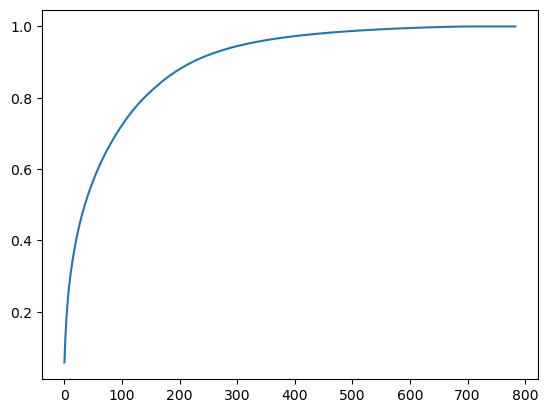

In [70]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))